CSCA 5642 Introduction to Deep Learning - Final Project. 

In this project, we would be focusing on classifying images uisng CNN. 
The dataset is obtained through Kaggle - https://www.kaggle.com/datasets/puneet6060/intel-image-classification


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import glob as gb
import cv2
import keras
from tensorflow.keras.models import Sequential, Model

In [2]:
trainpath = '/kaggle/input/intel-image-classification/seg_train/'
testpath = '/kaggle/input/intel-image-classification/seg_test/'
predpath = '/kaggle/input/intel-image-classification/seg_pred/'

In [3]:
for folder in  os.listdir(trainpath + 'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2512 in folder mountain
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings
For training data , found 2274 in folder sea
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier


In [4]:
for folder in  os.listdir(testpath + 'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier


In [5]:
files = gb.glob(pathname= str( predpath +'seg_pred/*.jpg'))
print(f'For Prediciton data , found {len(files)}')

For Prediciton data , found 7301


In [6]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x   

In [7]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(144, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(100, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(147, 150, 3)        1
(131, 150, 3)        1
(81, 150, 3)         1
(140, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64

In [8]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64

In [9]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
Name: count, dtype: int64

In [10]:
s=100
x_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        x_train.append(list(image_array))
        y_train.append(code[folder])

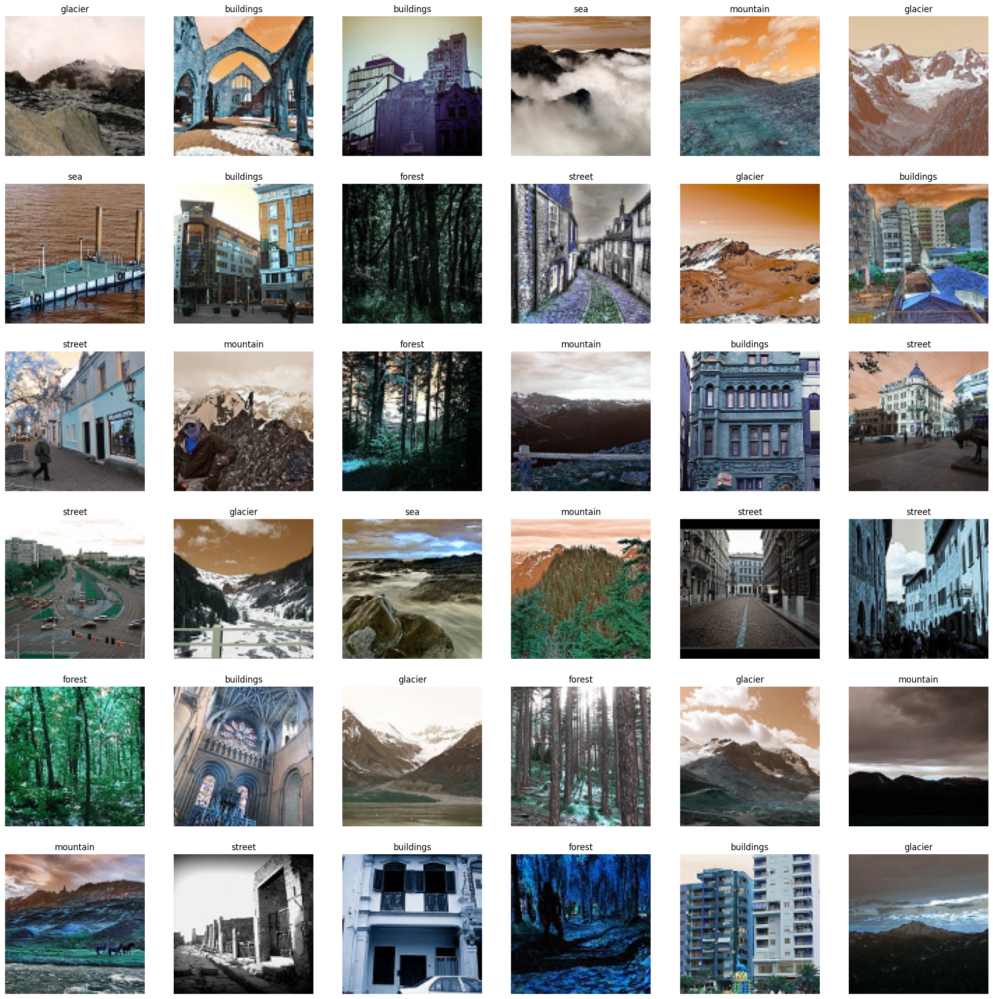

In [11]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [12]:
x_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        x_test.append(list(image_array))
        y_test.append(code[folder])

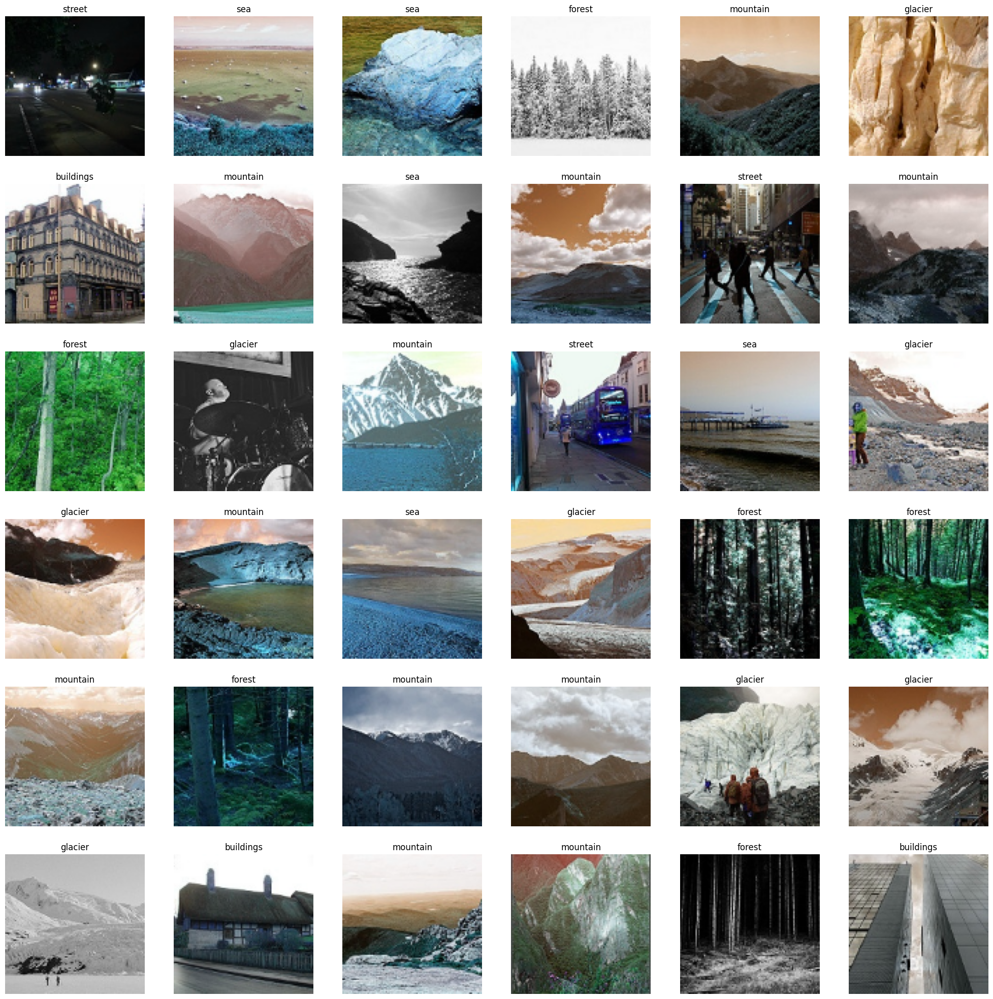

In [13]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [14]:
x_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    x_pred.append(list(image_array))  

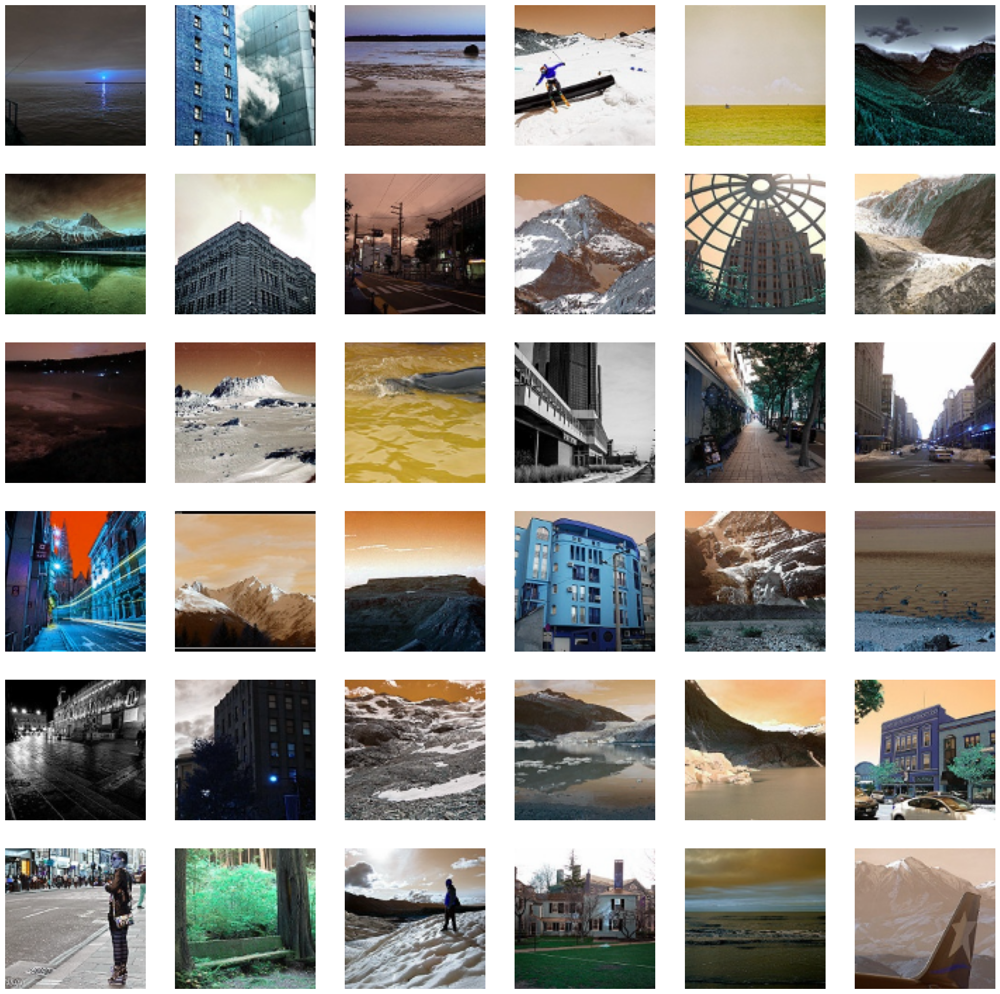

In [15]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')

In [16]:
x_train = np.array(x_train)
x_test = np.array(x_test)
x_pred_array = np.array(x_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {x_train.shape}')
print(f'X_test shape  is {x_test.shape}')
print(f'X_pred shape  is {x_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [17]:


KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])



/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [18]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [19]:
print(KerasModel.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 200)    │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 96, 96, 150)    │       270,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673,976 (2.57 MB)

 Trainable params: 673,976 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

None


In [20]:
ThisModel = KerasModel.fit(x_train, y_train, epochs=40,batch_size=64,verbose=1)

Epoch 1/40


I0000 00:00:1733387117.829367      92 service.cc:145] XLA service 0x7c5e44002dc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733387117.829424      92 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
2024-12-05 08:25:29.800991: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[150,200,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,200,98,98]{3,2,1,0}, f32[64,150,96,96]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-12-05 08:25:34.896417: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 6.095534979s
Trying algorithm eng0{} for conv (f32[150,20

  2/220 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - accuracy: 0.1875 - loss: 10.3351   

I0000 00:00:1733387138.082271      92 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


219/220 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.3340 - loss: 2.2023

2024-12-05 08:26:01.883196: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[150,200,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[18,200,98,98]{3,2,1,0}, f32[18,150,96,96]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-12-05 08:26:02.599223: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.716132431s
Trying algorithm eng0{} for conv (f32[150,200,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[18,200,98,98]{3,2,1,0}, f32[18,150,96,96]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv

220/220 ━━━━━━━━━━━━━━━━━━━━ 52s 134ms/step - accuracy: 0.3350 - loss: 2.1958
Epoch 2/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.5823 - loss: 1.0833
Epoch 3/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.6505 - loss: 0.9688
Epoch 4/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.7055 - loss: 0.8405
Epoch 5/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.7422 - loss: 0.7565
Epoch 6/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.7707 - loss: 0.6650
Epoch 7/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.7812 - loss: 0.6325
Epoch 8/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.8096 - loss: 0.5633
Epoch 9/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.8173 - loss: 0.5422
Epoch 10/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.8303 - loss: 0.5066
Epoch 11/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step - accuracy: 0.8382 - loss: 0.4971
Epoch 12/40
220/220 ━━━━━━━━━━━━━━━━━━━━

In [21]:
KerasModel.evaluate(x_test, y_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - accuracy: 0.8064 - loss: 1.4625


[1.2619904279708862, 0.8169999718666077]

In [22]:
KerasModel.predict(x_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step


array([[1.15391181e-08, 2.91905611e-08, 1.25968922e-03, 9.98321116e-01,
        4.19169985e-04, 7.39529965e-12],
       [3.95881161e-10, 1.63834155e-10, 2.20265565e-03, 9.97785211e-01,
        1.21537141e-05, 1.47858308e-14],
       [3.07549486e-10, 1.00366719e-08, 4.31436129e-05, 2.67937452e-01,
        7.32019424e-01, 8.36689225e-13],
       ...,
       [5.72268675e-07, 1.95957355e-07, 1.20244183e-01, 8.78660798e-01,
        1.09425525e-03, 1.40886736e-09],
       [1.14244969e-07, 1.00273824e-10, 6.20928705e-01, 3.78988087e-01,
        8.31166908e-05, 4.04444339e-10],
       [1.97669920e-06, 5.87385118e-09, 9.96114373e-01, 1.71963312e-03,
        2.16343254e-03, 4.40153144e-07]], dtype=float32)

In [23]:
y_result=KerasModel.predict(x_pred_array)

229/229 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step


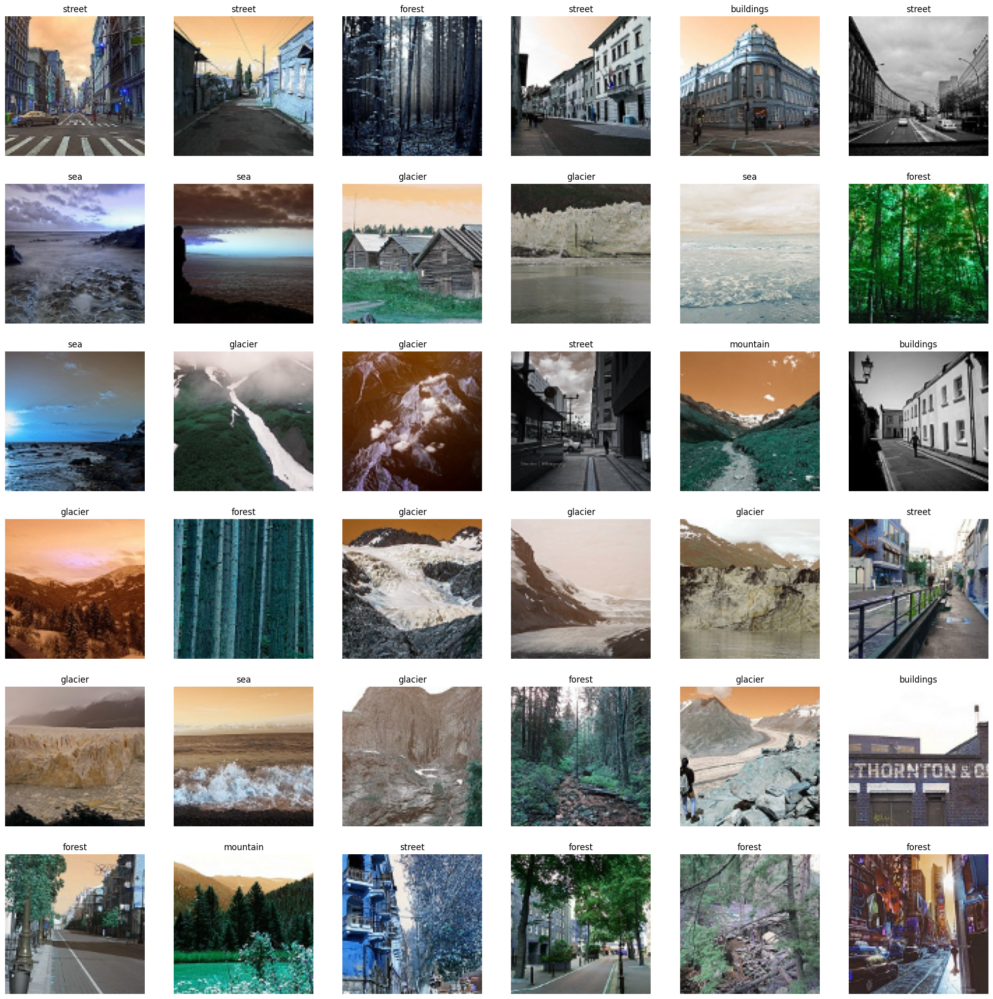

In [24]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

Conclusion

The Convolutional Neural Network (CNN) implemented for classifying natural scenes achieved an accuracy of approximately 81.7% on the test dataset with a loss of 1.26. This indicates that the model performs reasonably well in distinguishing images across six categories: buildings, forest, glacier, mountain, sea, and street. The following points summarize the performance and insights:

    Accuracy:
        The test accuracy of 81.7% demonstrates a good ability to generalize the learned patterns to unseen data, given the dataset's complexity and diversity.

    Loss:
        The test loss value of 1.26 suggests there is room for improvement. A high loss despite good accuracy might indicate misclassified outliers or a need for better optimization.

    Dataset Diversity:
        With 25k images across 6 categories, the dataset appears balanced and comprehensive, aiding the model's ability to learn diverse features effectively.

    Evaluation Metrics:
        The accuracy metric provides a general view of the model's performance but might not reflect class imbalances (if any). Further evaluation using a confusion matrix, precision, recall, and F1-score would provide deeper insights.

    Potential Improvements:
        Data Augmentation: Employing techniques such as rotation, flipping, and brightness adjustment could enhance the model's robustness.
        Hyperparameter Tuning: Further tuning of parameters like learning rate, batch size, and the number of layers/filters in the CNN could improve both accuracy and loss.
        Regularization: Incorporating dropout or L2 regularization might help reduce overfitting.
        Learning Rate Optimization: Implementing a learning rate scheduler or fine-tuning with transfer learning could yield better results.

    Application Potential:
        With its current performance, the model can already be applied to classify natural scenes in real-world applications like geographical tagging, tourism, and environmental monitoring.

In summary, the CNN model demonstrates promising performance, achieving over 80% accuracy on the test data. With further fine-tuning and optimization, the model could reach even higher accuracy and lower loss values, making it a robust solution for natural scene classification tasks.